In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import os


In [5]:
# Import training data & testing data
cwd = os.getcwd()
train_data_import = pd.read_csv(cwd + "./banking_train.csv", sep=";")
test_data_import = pd.read_csv(cwd + "./banking_test.csv", sep=";")

# Create copies of the original data to manipulate
train_data = train_data_import.copy()
test_data = test_data_import.copy()

## Project Ideas:
* Explore the demographics within the dataset and compare to default status
* Find the variable(s) that best predict the default status 

In [6]:
train_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


## Data Cleaning
* Explore missing values
* Remove predictor variables with weak predictive power

In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [54]:
train_data.describe()

,age,balance,day,duration,campaign,pdays,previous,neg_balance
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323,0.083298
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441,0.276336
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000,1.000000


## Exploratory Data Analysis

In [8]:
train_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [9]:
# Explore the distribution of our target variable


fig = px.histogram(train_data, x='y')
fig.show()

## Percentage of Data per Class
### <u>Imbalanced</u> target values will have to be balanced before creating a model
* We will handle this later...

In [10]:
default_count = train_data[train_data["y"] == "yes"].shape[0]
not_default_count = train_data[train_data["y"] == "no"].shape[0]

print("****Negative Class****")
print(round(default_count / train_data.shape[0], 2) * 100)
print("****Positive Class****")
print(round(not_default_count / train_data.shape[0], 2) * 100)

****Negative Class****
12.0
****Positive Class****
88.0


## Examine the <b>Distributions</b> of the Numeric Variables

In [11]:
# Visualize the distribution of Default Status by Age

fig = px.histogram(train_data, x="age", color="y", title="Default Status Count by Age")
fig.show()

In [12]:
# Visualize the distribution of Default Status by Job
job_counts = train_data["job"].value_counts(ascending=False)
job_counts

fig = px.histogram(train_data, x="job", color="y", title="Default Status Count by Job")
fig.show()

In [13]:
fig = px.histogram(train_data, x="marital", color="y", title="Marital Status Count by Default Status")
fig.show()

In [14]:
fig = px.histogram(train_data, x="education", color="y")
fig.show()

In [15]:
fig = px.histogram(train_data, x="housing", color="y")
fig.show()

In [16]:
fig = px.histogram(train_data, x="loan", color="y")
fig.show()

In [17]:
fig = px.histogram(train_data, x="contact", color="y")
fig.show()

In [18]:
fig = px.histogram(train_data, "poutcome", color="y")
fig.show()

In [19]:
fig = px.scatter(train_data, x="age", y="balance", color="y")
fig.show()

In [20]:
fig = px.scatter(train_data, x="age", y="y")
fig.show()

In [21]:
fig = px.scatter(train_data, x="balance", y="y")
fig.show()

## Explore and Eliminate Outliers in the Data

Lower Limit for Age Outliers: 10.5
Upper Limit for Age Outliers: 70.5


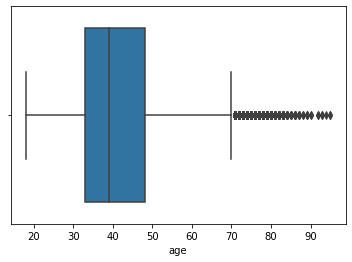

Lower Limit for Balance Outliers: -1962.0
Upper Limit for Balance Outliers: 3462.0


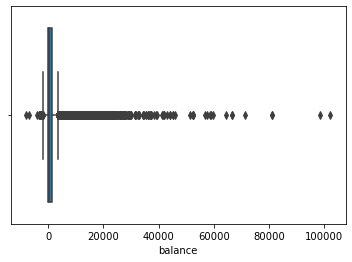

In [68]:
# Created the upper and lower limits to determine outliers : Age
iqr_age = train_data["age"].quantile(.75) - train_data["age"].quantile(.25)
lower_limit_age = train_data["age"].quantile(.25) - (iqr_age * 1.5)
upper_limit_age = train_data["age"].quantile(.75) + (iqr_age * 1.5)
print(f"Lower Limit for Age Outliers: {lower_limit_age}") 
print(f"Upper Limit for Age Outliers: {upper_limit_age}") 

# Create box plot for age
sns.boxplot(x="age", data=train_data)
plt.show()

# Created the upper and lower limits to determine outliers : Balance
iqr_balance = train_data["balance"].quantile(.75) - train_data["balance"].quantile(.25)
lower_limit_balance = train_data["balance"].quantile(.25) - (iqr_balance * 1.5)
upper_limit_balance = train_data["balance"].quantile(.75) + (iqr_balance * 1.5)
print(f"Lower Limit for Balance Outliers: {lower_limit_balance}") 
print(f"Upper Limit for Balance Outliers: {upper_limit_balance}") 

# Create box plot for balance
sns.boxplot(x="balance", data=train_data)
plt.show()


### 1. Elminate Outliers in <b>Age</b> Variable

In [74]:
# Subset & Count records that have age values above the upper limit
age_outlier_upper = train_data.loc[train_data["age"] > 70,:]
age_outlier_upper_count = age_outlier_upper.shape[0]

# Subset & Count records that have age values below the lower limit
age_outlier_lower = train_data.loc[train_data["age"] <= 10,:]
age_outlier_lower_count = age_outlier_lower.shape[0]

# Print the Count of records with Outliers in the age variable
print(f"{age_outlier_upper_count} records with age outliers above the Upper Limit")
print(f"{age_outlier_lower_count} records with age outliers below the Lower Limit")

487 records with age outliers above the Upper Limit
0 records with age outliers below the Lower Limit


In [80]:
# Drop the records with age values above upper limit from original dataframe
train_data = train_data.drop(age_outlier_upper.index, axis=0)

# Compare size of original dataframe against modified(dropped age outliers) dataset
original_data_size = train_data.size[0]

### 2. Eliminate Outliers in <b>Balance</b> Variable

In [75]:
# Subset & Count records that have balance values above the upper limit
bal_outlier_upper = train_data.loc[train_data["balance"] > 3462,:]
bal_outlier_upper_count = bal_outlier_upper.shape[0]

# Subset & Count records that have balance values below the lower limit
bal_outlier_lower = train_data.loc[train_data["balance"] <= -1962,:]
bal_outlier_lower_count = bal_outlier_lower.shape[0]

# Print the Count of records with Outliers in the age variable
print(f"{bal_outlier_upper_count} records with balance outliers above the Upper Limit")
print(f"{bal_outlier_lower_count} records with balance outliers below the Lower Limit")

4712 records with balance outliers above the Upper Limit
17 records with balance outliers below the Lower Limit


In [ ]:
age_outliers = train_data.loc[train_data["age"] >= 70,:]
age_outliers.shape

## Eliminate Variables with Useless Information & Weak Predictive Power

In [22]:
train_data["poutcome"].value_counts(ascending=False)

unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64

In [23]:
list(train_data.columns)

['age',
 'job',
 'marital',
 'education',
 'default',
 'balance',
 'housing',
 'loan',
 'contact',
 'day',
 'month',
 'duration',
 'campaign',
 'pdays',
 'previous',
 'poutcome',
 'y']

## Feature Engineering

In [24]:
# Create a column to indicate customers with negative balances

def negative_ind(series):
    if series < 0:
        return 1
    else:
        return 0

train_data["neg_balance"] = train_data["balance"].apply(negative_ind)


# Create a column to seperate balance values into bins

def balance_bins(series):
    if series > 60000:
        return "> 60K"
    elif series > 30000:
        return "30-60K"
    elif series > 10000:
        return "10-30K"
    else:
        return "< 10k"

train_data["balance_cat"] = train_data["balance"].apply(balance_bins)

In [25]:
fig = px.histogram(train_data, x="balance_cat", color="y")
fig.show()

In [26]:
fig = px.histogram(train_data, x="neg_balance", color="y")
fig.show()

## Examine Outliers in the Data

In [27]:
cat_data = train_data.select_dtypes(exclude="int")
cat_data = cat_data.drop("y", axis=1)
cat_data

,job,marital,education,default,housing,loan,contact,month,poutcome,balance_cat
0,management,married,tertiary,no,yes,no,unknown,may,unknown,< 10k
1,technician,single,secondary,no,yes,no,unknown,may,unknown,< 10k
2,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,< 10k
3,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,< 10k
4,unknown,single,unknown,no,no,no,unknown,may,unknown,< 10k
...,...,...,...,...,...,...,...,...,...,...
45206,technician,married,tertiary,no,no,no,cellular,nov,unknown,< 10k
45207,retired,divorced,primary,no,no,no,cellular,nov,unknown,< 10k
45208,retired,married,secondary,no,no,no,cellular,nov,success,< 10k
45209,blue-collar,married,secondary,no,no,no,telephone,nov,unknown,< 10k


In [28]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

cat_cols = ["job", "marital", "education", "contact", "month", "balance_cat"]
binary_cols = ["default", "housing", "loan"]

def binary_convert(series):
    if series == "yes":
        return 1
    else:
        return 0

for col in binary_cols:
    cat_data[col + "_ind"] = cat_data[col].apply(binary_convert)

for col in cat_cols:
    one_hot = LabelEncoder()
    cat_data[col + "_ind"] = one_hot.fit_transform(cat_data[col])


In [29]:
cat_data

,job,marital,education,default,housing,loan,contact,month,poutcome,balance_cat,default_ind,housing_ind,loan_ind,job_ind,marital_ind,education_ind,contact_ind,month_ind,balance_cat_ind
0,management,married,tertiary,no,yes,no,unknown,may,unknown,< 10k,0,1,0,4,1,2,2,8,2
1,technician,single,secondary,no,yes,no,unknown,may,unknown,< 10k,0,1,0,9,2,1,2,8,2
2,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,< 10k,0,1,1,2,1,1,2,8,2
3,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,< 10k,0,1,0,1,1,3,2,8,2
4,unknown,single,unknown,no,no,no,unknown,may,unknown,< 10k,0,0,0,11,2,3,2,8,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,technician,married,tertiary,no,no,no,cellular,nov,unknown,< 10k,0,0,0,9,1,2,0,9,2
45207,retired,divorced,primary,no,no,no,cellular,nov,unknown,< 10k,0,0,0,5,0,0,0,9,2
45208,retired,married,secondary,no,no,no,cellular,nov,success,< 10k,0,0,0,5,1,1,0,9,2
45209,blue-collar,married,secondary,no,no,no,telephone,nov,unknown,< 10k,0,0,0,1,1,1,1,9,2


In [30]:
processed_data = cat_data.iloc[:,10:]
processed_data.head()

,default_ind,housing_ind,loan_ind,job_ind,marital_ind,education_ind,contact_ind,month_ind,balance_cat_ind
0,0,1,0,4,1,2,2,8,2
1,0,1,0,9,2,1,2,8,2
2,0,1,1,2,1,1,2,8,2
3,0,1,0,1,1,3,2,8,2
4,0,0,0,11,2,3,2,8,2


In [31]:
# Convert target variable to a binary series
y_conv = train_data["y"].apply(binary_convert)
y_conv.value_counts()


0    39922
1     5289
Name: y, dtype: int64

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, roc_auc_score, recall_score, accuracy_score, classification_report, r2_score, ConfusionMatrixDisplay, confusion_matrix, RocCurveDisplay
from sklearn.preprocessing import StandardScaler 
from imblearn.over_sampling import SMOTE

In [33]:
X = processed_data
y = y_conv

os = SMOTE(random_state=42)

X_os, y_os = os.fit_resample(X, y)
print(f" X shape: {X_os.shape}")
print(f" y shape: {y_os.shape}")




 X shape: (79844, 9)
 y shape: (79844,)


In [34]:


X_train, X_test, y_train, y_test = train_test_split(X_os, y_os, test_size=.3, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LogisticRegression(random_state=42)
rf = RandomForestClassifier(random_state=42)

lr_cval = cross_val_score(lr, X_train_scaled, y_train, cv=10)
rf_cval = cross_val_score(rf, X_train_scaled, y_train, cv=10)

print(f"Logistic Regression Cross Validation {lr_cval.mean()}")
print(f"Random Forest Cross Validation {rf_cval.mean()}")



Logistic Regression Cross Validation 0.6629092860976918
Random Forest Cross Validation 0.7427088924673465


## Random Forest Classifier
* After Cross validation, we see that <b>Random Forest</b> model performs better than the <b>Logistic Regression</b>
* Now lets <b>make predictions</b>, <b>calculate metrics</b>, and <b>fine tune the hyperparameters</b> 

1    12218
0    11736
dtype: int64
              precision    recall  f1-score   support

           0       0.74      0.73      0.73     11973
           1       0.73      0.75      0.74     11981

    accuracy                           0.74     23954
   macro avg       0.74      0.74      0.74     23954
weighted avg       0.74      0.74      0.74     23954

ROC AUC Score: 0.8197753921645741
Accuracy Score: 0.7356182683476664


<Figure size 1080x1080 with 0 Axes>

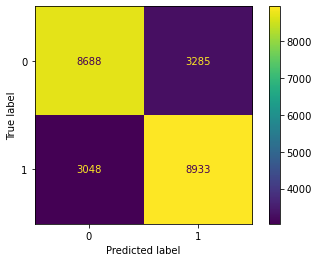

In [52]:
rf.fit(X_train_scaled, y_train)
y_pred = rf.predict(X_test_scaled)
y_prob = rf.predict_proba(X_test_scaled)
y_prob = y_prob[:,1]

# Make sure the predictions are distributed properly
print(pd.Series(y_pred).value_counts())

rf_report = classification_report(y_test, y_pred)
rf_roc = roc_auc_score(y_test, y_prob)
rf_acc = accuracy_score(y_test, y_pred)

print(rf_report)
print(f"ROC AUC Score: {rf_roc}")
print(f"Accuracy Score: {rf_acc}")


conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

fig = plt.figure(figsize=(15,15))
disp.plot()
plt.show()



[]

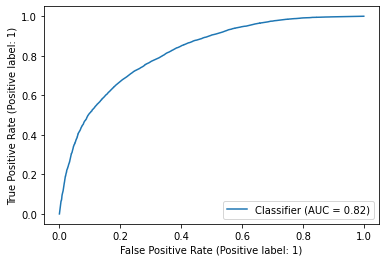

In [36]:
RocCurveDisplay.from_predictions(y_test, y_prob)
plt.plot()

## Tune Hyperparameters for the Random Forest Model

In [47]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Parameter values for grid search
param_grid = {
              "n_estimators": [100, 200, 500],
              "criterion": ("gini", "entropy", "log_loss"),
              "max_depth": [5, 10, 15, 50],
              "max_features": ["sqrt", "log2"]
}


# Create a new model for Parameter Tuning
rf_model = RandomForestClassifier(random_state=42)

# Create Grid Search CV object with classifier and parameter grid
clf = GridSearchCV(rf_model, param_grid, n_jobs=-1, cv=10)

# Fit Grid Search CV object
clf.fit(X_train_scaled, y_train)

clf.get_params




<bound method BaseEstimator.get_params of GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=42),
             n_jobs=-1,
             param_grid={'criterion': ('gini', 'entropy', 'log_loss'),
                         'max_depth': [5, 10, 15, 50],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [100, 200, 500]})>

In [48]:

clf.best_params_







{'criterion': 'gini',
 'max_depth': 50,
 'max_features': 'sqrt',
 'n_estimators': 500}

In [49]:
clf.best_estimator_

RandomForestClassifier(max_depth=50, n_estimators=500, random_state=42)

              precision    recall  f1-score   support

           0       0.74      0.73      0.73     11973
           1       0.73      0.74      0.74     11981

    accuracy                           0.74     23954
   macro avg       0.74      0.74      0.74     23954
weighted avg       0.74      0.74      0.74     23954

ROC AUC Score: 0.8194999100478649
Accuracy Score: 0.7363697086081656


<Figure size 1080x1080 with 0 Axes>

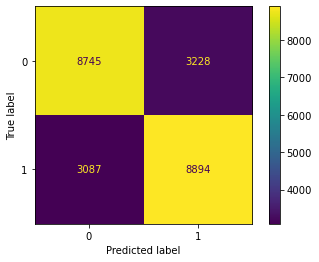

In [51]:
final_model = RandomForestClassifier(max_depth=50, n_estimators=50, random_state=42)
final_model.fit(X_train_scaled, y_train)

final_pred = final_model.predict(X_test_scaled)
final_prob = final_model.predict_proba(X_test_scaled)
final_prob = final_prob[:,1]


# Create Classification Scores Report & ROC AUC Score
final_report = classification_report(y_test, final_pred)
final_roc = roc_auc_score(y_test, final_prob)
final_acc = accuracy_score(y_test, final_pred)

print(final_report)
print(f"ROC AUC Score: {final_roc}")
print(f"Accuracy Score: {final_acc}")

# Visualize the Confusion Matrix
conf_matrix = confusion_matrix(y_test, final_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

fig = plt.figure(figsize=(15,15))
disp.plot()
plt.show()



[]

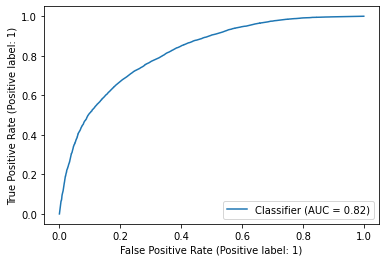

In [44]:
# Visualize the ROC AUC Curve
RocCurveDisplay.from_predictions(y_test, y_prob)
plt.plot()